In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
transactionData = pd.read_excel('data/QVI_transaction_data.xlsx')
customerData = pd.read_csv('data/QVI_purchase_behaviour.csv')

### Data Inspection

Transaction Data

In [5]:
transactionData.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264836 entries, 0 to 264835
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DATE            264836 non-null  int64  
 1   STORE_NBR       264836 non-null  int64  
 2   LYLTY_CARD_NBR  264836 non-null  int64  
 3   TXN_ID          264836 non-null  int64  
 4   PROD_NBR        264836 non-null  int64  
 5   PROD_NAME       264836 non-null  object 
 6   PROD_QTY        264836 non-null  int64  
 7   TOT_SALES       264836 non-null  float64
dtypes: float64(1), int64(6), object(1)
memory usage: 16.2+ MB


In [6]:
transactionData.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,43605,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,43329,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,43330,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8


In [7]:
transactionData.columns

Index(['DATE', 'STORE_NBR', 'LYLTY_CARD_NBR', 'TXN_ID', 'PROD_NBR',
       'PROD_NAME', 'PROD_QTY', 'TOT_SALES'],
      dtype='object')

In [8]:
# Change DATE to datetime
transactionData['DATE'] = pd.to_datetime(transactionData['DATE'], origin='1899-12-30', unit='D')

In [9]:
transactionData.describe()

,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_QTY,TOT_SALES
count,264836.00000,2.648360e+05,2.648360e+05,264836.000000,264836.000000,264836.000000
mean,135.08011,1.355495e+05,1.351583e+05,56.583157,1.907309,7.304200
std,76.78418,8.057998e+04,7.813303e+04,32.826638,0.643654,3.083226
min,1.00000,1.000000e+03,1.000000e+00,1.000000,1.000000,1.500000
25%,70.00000,7.002100e+04,6.760150e+04,28.000000,2.000000,5.400000
50%,130.00000,1.303575e+05,1.351375e+05,56.000000,2.000000,7.400000
75%,203.00000,2.030942e+05,2.027012e+05,85.000000,2.000000,9.200000
max,272.00000,2.373711e+06,2.415841e+06,114.000000,200.000000,650.000000


In [10]:
transactionData[['PROD_QTY', 'TOT_SALES']].describe()

,PROD_QTY,TOT_SALES
count,264836.000000,264836.000000
mean,1.907309,7.304200
std,0.643654,3.083226
min,1.000000,1.500000
25%,2.000000,5.400000
50%,2.000000,7.400000
75%,2.000000,9.200000
max,200.000000,650.000000


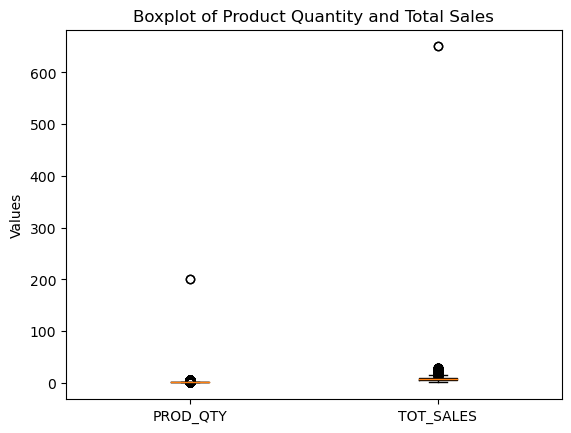

In [11]:
plt.boxplot([transactionData['PROD_QTY'], transactionData['TOT_SALES']], labels=['PROD_QTY', 'TOT_SALES'])
plt.title("Boxplot of Product Quantity and Total Sales")
plt.ylabel("Values")
plt.show()

In [12]:
# Remove outliers
transactionData.sort_values(by='PROD_QTY', ascending=False).head(5)

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
69762,2018-08-19,226,226000,226201,4,Dorito Corn Chp Supreme 380g,200,650.0
69763,2019-05-20,226,226000,226210,4,Dorito Corn Chp Supreme 380g,200,650.0
217237,2019-05-18,201,201060,200202,26,Pringles Sweet&Spcy BBQ 134g,5,18.5
238333,2018-08-14,219,219004,218018,25,Pringles SourCream Onion 134g,5,18.5
238471,2019-05-19,261,261331,261111,87,Infuzions BBQ Rib Prawn Crackers 110g,5,19.0


In [13]:
transactionData = transactionData.drop(transactionData[transactionData['PROD_QTY']>100].index)

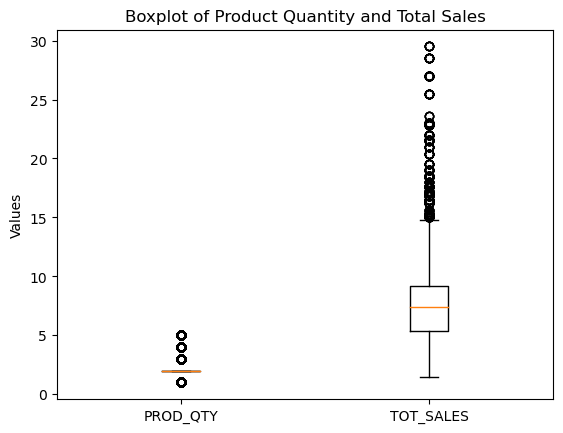

In [14]:
plt.boxplot([transactionData['PROD_QTY'], transactionData['TOT_SALES']], labels=['PROD_QTY', 'TOT_SALES'])
plt.title("Boxplot of Product Quantity and Total Sales")
plt.ylabel("Values")
plt.show()

In [15]:
transactionData[['PROD_NBR', 'PROD_NAME']].value_counts()


PROD_NBR  PROD_NAME                               
102       Kettle Mozzarella   Basil & Pesto 175g      3304
108       Kettle Tortilla ChpsHny&Jlpno Chili 150g    3296
33        Cobs Popd Swt/Chlli &Sr/Cream Chips 110g    3269
112       Tyrrells Crisps     Ched & Chives 165g      3268
75        Cobs Popd Sea Salt  Chips 110g              3265
                                                      ... 
11        RRD Pc Sea Salt     165g                    1431
76        Woolworths Medium   Salsa 300g              1430
98        NCC Sour Cream &    Garden Chives 175g      1419
29        French Fries Potato Chips 175g              1418
72        WW Crinkle Cut      Original 175g           1410
Length: 114, dtype: int64

In [16]:
transactionData['PROD_NAME'].unique()
pd.DataFrame(transactionData['PROD_NAME'].unique(), columns=['PROD_NAME']).to_excel('product_names.xlsx', index=False)

In [17]:
# Remove irrelevant products 'salsa'
transactionData = transactionData[~transactionData['PROD_NAME'].str.contains('salsa', case=False)]

In [18]:
transactionData.shape
# 264836 rows before

(246740, 8)

**Summary**
- There is no null value
- Date changed to DateTime
- Outlier removed (Where PROD_QTY = 200 and TOT_SALES = 650)
- Irrelevant products removed

Customer Data

In [19]:
customerData.head()

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream


In [20]:
customerData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72637 entries, 0 to 72636
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   LYLTY_CARD_NBR    72637 non-null  int64 
 1   LIFESTAGE         72637 non-null  object
 2   PREMIUM_CUSTOMER  72637 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.7+ MB


In [21]:
customerData['LIFESTAGE'].unique()

array(['YOUNG SINGLES/COUPLES', 'YOUNG FAMILIES', 'OLDER SINGLES/COUPLES',
       'MIDAGE SINGLES/COUPLES', 'NEW FAMILIES', 'OLDER FAMILIES',
       'RETIREES'], dtype=object)

In [22]:
customerData['PREMIUM_CUSTOMER'].unique()

array(['Premium', 'Mainstream', 'Budget'], dtype=object)

**Summary**
- There is no null value

### Merge Date

In [23]:
QVI_data = pd.merge(transactionData, customerData, on='LYLTY_CARD_NBR', how='left')

In [24]:
QVI_data.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,LIFESTAGE,PREMIUM_CUSTOMER
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,YOUNG SINGLES/COUPLES,Premium
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,MIDAGE SINGLES/COUPLES,Budget
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,MIDAGE SINGLES/COUPLES,Budget
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,MIDAGE SINGLES/COUPLES,Budget
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,MIDAGE SINGLES/COUPLES,Budget


### Feature Engineering

- Unit Price
- Extract Pack Size
- Group Pack Size to different category (small, medium, large, XL)
- Extract Brand Name

In [25]:
QVI_data['Unit_Price'] = QVI_data['TOT_SALES'] / QVI_data['PROD_QTY']
QVI_data['Brand_Name'] = QVI_data['PROD_NAME'].str.split(' ').str[0].str.upper()
QVI_data['Package_Size_g']= QVI_data['PROD_NAME'].str.extract('(\d+)').astype(float)
QVI_data.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,LIFESTAGE,PREMIUM_CUSTOMER,Unit_Price,Brand_Name,Package_Size_g
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,YOUNG SINGLES/COUPLES,Premium,3.00,NATURAL,175.0
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,MIDAGE SINGLES/COUPLES,Budget,2.10,CCS,175.0
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,MIDAGE SINGLES/COUPLES,Budget,1.45,SMITHS,170.0
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,MIDAGE SINGLES/COUPLES,Budget,3.00,SMITHS,175.0
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,MIDAGE SINGLES/COUPLES,Budget,4.60,KETTLE,150.0


In [26]:
sorted(QVI_data['Brand_Name'].unique())

['BURGER',
 'CCS',
 'CHEETOS',
 'CHEEZELS',
 'COBS',
 'DORITO',
 'DORITOS',
 'FRENCH',
 'GRAIN',
 'GRNWVES',
 'INFUZIONS',
 'INFZNS',
 'KETTLE',
 'NATURAL',
 'NCC',
 'PRINGLES',
 'RED',
 'RRD',
 'SMITH',
 'SMITHS',
 'SNBTS',
 'SUNBITES',
 'THINS',
 'TOSTITOS',
 'TWISTIES',
 'TYRRELLS',
 'WOOLWORTHS',
 'WW']

In [27]:
brand_mapping = {
    'RED': 'RRD',
    'RRD': 'RRD',
    'WOOLWORTHS': 'WOOLWORTHS',
    'WW': 'WOOLWORTHS',
    'DORITO': 'DORITOS',
    'DORITOS': 'DORITOS',
    'INFUZIONS': 'INFUZIONS',
    'INFZNS': 'INFUZIONS',
    'SMITH': 'SMITHS',
    'SMITHS': 'SMITHS',
    'SNBTS': 'SUNBITES',
    'SUNBITES': 'SUNBITES',
    'BURGER': 'BURGER',
    'CCS': 'CCS',
    'CHEETOS': 'CHEETOS',
    'CHEEZELS': 'CHEEZELS',
    'COBS': 'COBS',
    'FRENCH': 'FRENCH',
    'GRAIN': 'GRAINWAVES',
    'GRNWVES': 'GRAINWAVES',
    'KETTLE': 'KETTLE',
    'NATURAL': 'NCC',
    'NCC': 'NCC',
    'PRINGLES': 'PRINGLES',
    'THINS': 'THINS',
    'TOSTITOS': 'TOSTITOS',
    'TWISTIES': 'TWISTIES',
    'TYRRELLS': 'TYRRELLS',
}

In [28]:
QVI_data['Brand_Name'] = QVI_data['Brand_Name'].replace(brand_mapping)

In [29]:
sorted(QVI_data['Brand_Name'].unique())

['BURGER',
 'CCS',
 'CHEETOS',
 'CHEEZELS',
 'COBS',
 'DORITOS',
 'FRENCH',
 'GRAINWAVES',
 'INFUZIONS',
 'KETTLE',
 'NCC',
 'PRINGLES',
 'RRD',
 'SMITHS',
 'SUNBITES',
 'THINS',
 'TOSTITOS',
 'TWISTIES',
 'TYRRELLS',
 'WOOLWORTHS']

In [30]:
QVI_data['Package_Size_g'].describe()

count    246740.000000
mean        175.583521
std          59.432118
min          70.000000
25%         150.000000
50%         170.000000
75%         175.000000
max         380.000000
Name: Package_Size_g, dtype: float64

In [31]:
QVI_data['Package_Size_g'].unique()

array([175., 170., 150., 330., 210., 270., 220., 125., 110., 134., 380.,
       180., 165., 135., 250., 200., 160., 190.,  90.,  70.])

In [32]:
bins = [0, 120, 200,250, float('inf')]
labels = ['Small', 'Medium', 'Large', 'XL']

In [33]:
QVI_data['Package_Size'] = pd.cut(QVI_data['Package_Size_g'], bins=bins, labels=labels, right=True)

In [34]:
QVI_data['Package_Size'].value_counts()

Medium    183592
Small      26902
XL         25241
Large      11005
Name: Package_Size, dtype: int64

### Save Cleaned Data

In [35]:
QVI_data.to_csv('cleaned_QVI_data.csv', index=False)

### EDA

In [36]:
sns.set_theme(style="whitegrid", palette="pastel")
#sns.set_palette('Set2')

### Sales Analysis

Text(0.5, 1.0, 'Total Sales Over Time')

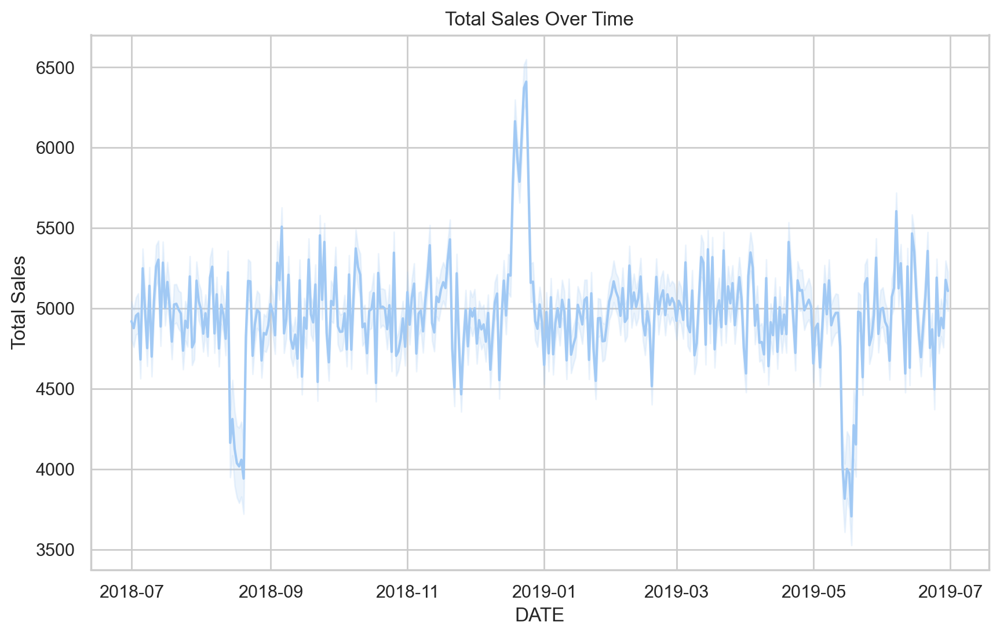

In [37]:
plt.figure(figsize=(10, 6), dpi=200)
sns.lineplot(data=QVI_data, x='DATE', y='TOT_SALES',estimator='sum')
plt.ylabel('Total Sales')
plt.title('Total Sales Over Time')

(17836.0, 17928.0)

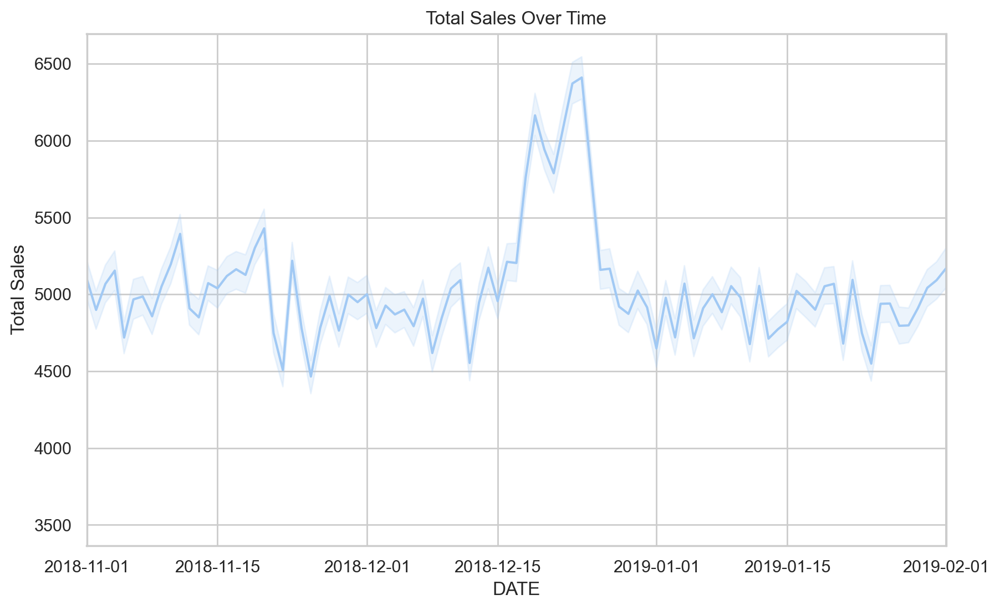

In [38]:
plt.figure(figsize=(10, 6), dpi=200)
sns.lineplot(data=QVI_data, x='DATE', y='TOT_SALES',estimator='sum')
plt.ylabel('Total Sales')
plt.title('Total Sales Over Time')
plt.xlim(pd.Timestamp('2018-11-01'), pd.Timestamp('2019-02-01'))

There is an increase in Sales in the lead-up to Christmas, while a decline is observed in both August and May.

In [39]:
import textwrap

In [40]:
order = QVI_data.groupby('LIFESTAGE')['TOT_SALES'].sum().sort_values(ascending=False).index
labels = [textwrap.fill(label, 12) for label in order]

In [41]:
light_blue = '#b6caff'
purple = '#8686C7'
blue2 = '#92A5D1'

[Text(0, 0, 'OLDER SINGLE\nS/COUPLES'),
 Text(1, 0, 'RETIREES'),
 Text(2, 0, 'OLDER\nFAMILIES'),
 Text(3, 0, 'YOUNG\nFAMILIES'),
 Text(4, 0, 'YOUNG SINGLE\nS/COUPLES'),
 Text(5, 0, 'MIDAGE SINGL\nES/COUPLES'),
 Text(6, 0, 'NEW FAMILIES')]

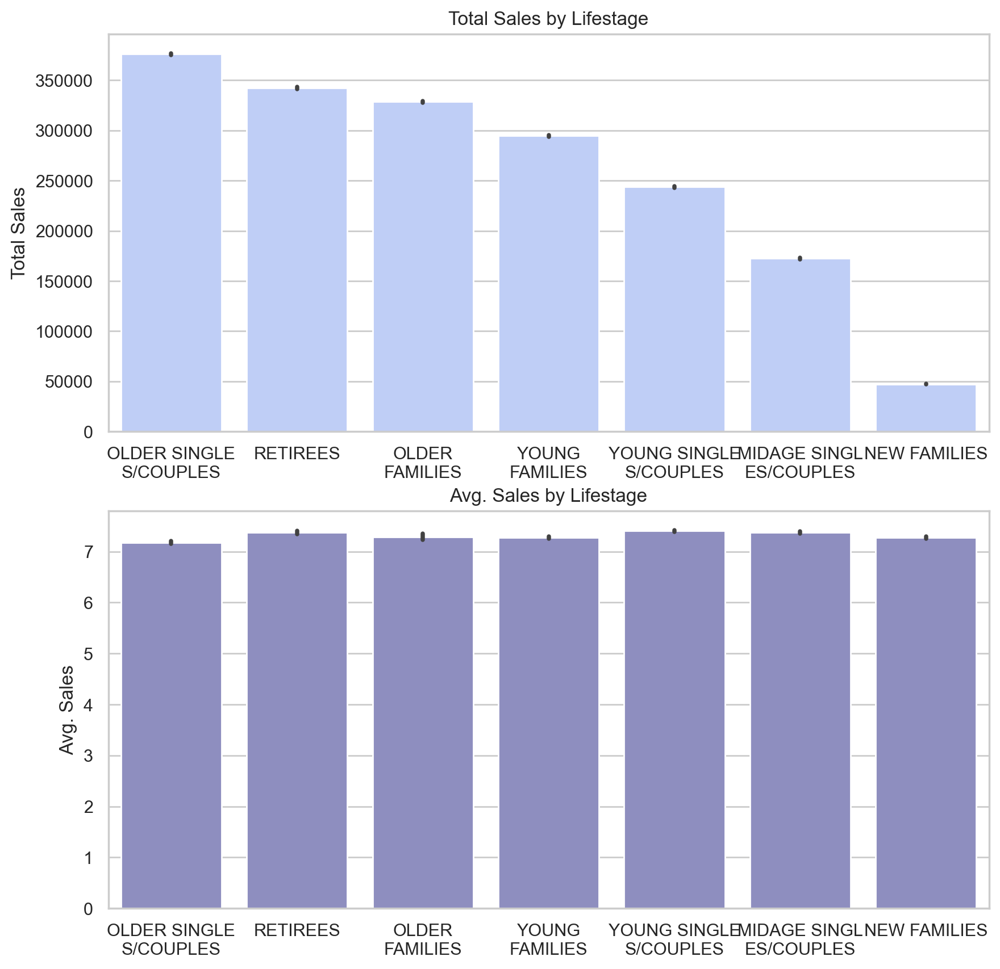

In [42]:
# Sales by premium customer
fig, ax = plt.subplots(2,1,figsize=(10,10),dpi=200)
#Sum total sales
order_lifestage = QVI_data.groupby('LIFESTAGE')['TOT_SALES'].sum().sort_values(ascending=False).index
sns.barplot(data=QVI_data, x='LIFESTAGE', y='TOT_SALES', estimator=sum, 
            order=order_lifestage, ax=ax[0],palette=['#b6caff'])
ax[0].set_ylabel('Total Sales')
ax[0].set_title('Total Sales by Lifestage')
ax[0].set_xlabel('')
ax[0].set_xticks(range(len(order_lifestage)))
ax[0].set_xticklabels(labels)

# Average Sales per customer
sns.barplot(data=QVI_data, x='LIFESTAGE', y='TOT_SALES', 
            estimator=np.mean,
            ax=ax[1], palette=['#8686C7'])
ax[1].set_ylabel('Avg. Sales')
ax[1].set_xlabel('')
ax[1].set_title('Avg. Sales by Lifestage')
ax[1].set_xticks(range(len(order_lifestage)))
ax[1].set_xticklabels(labels)


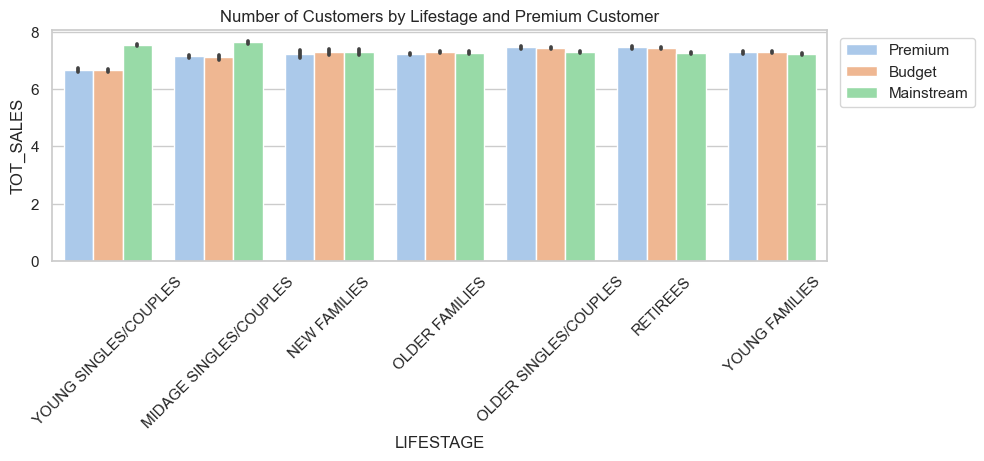

In [43]:
plt.figure(figsize=(10, 3))
sns.barplot(data=QVI_data, x='LIFESTAGE', y='TOT_SALES', hue='PREMIUM_CUSTOMER')
plt.xticks(rotation=45)
plt.title('Number of Customers by Lifestage and Premium Customer')
plt.legend(loc = 'upper right', bbox_to_anchor=(1.2, 1))

'Mainstream-Yong Singles/Couples' & 'Mainstream Midage Singles/couples' are the two customer group that contribute to the most of sales.

In [77]:
grouped_data = QVI_data.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])['LYLTY_CARD_NBR'].nunique().reset_index()
grouped_data.rename(columns={'LYLTY_CARD_NBR': 'CARD_COUNT'}, inplace=True)
grouped_data.head()

,LIFESTAGE,PREMIUM_CUSTOMER,CARD_COUNT
0,MIDAGE SINGLES/COUPLES,Budget,1474
1,MIDAGE SINGLES/COUPLES,Mainstream,3298
2,MIDAGE SINGLES/COUPLES,Premium,2369
3,NEW FAMILIES,Budget,1087
4,NEW FAMILIES,Mainstream,830


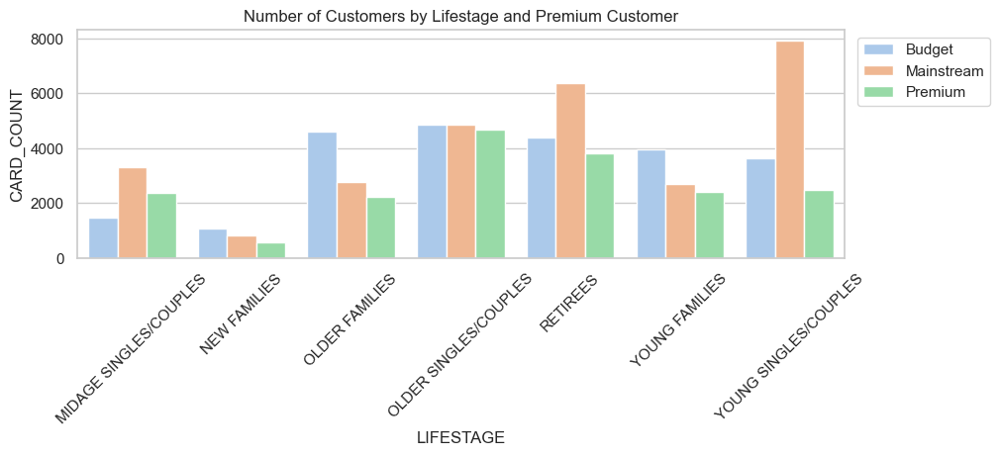

In [79]:
plt.figure(figsize=(10, 3))
sns.barplot(data=grouped_data, x='LIFESTAGE', y='CARD_COUNT', hue='PREMIUM_CUSTOMER')
plt.xticks(rotation=45)
plt.title('Number of Customers by Lifestage and Premium Customer')
plt.legend(loc = 'upper right', bbox_to_anchor=(1.2, 1))

In [85]:
grouped_data_tran = QVI_data.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER']).size().reset_index(name='COUNT')

In [89]:
grouped_data_tran.sort_values(by='COUNT',ascending=False)

,LIFESTAGE,PREMIUM_CUSTOMER,COUNT
6,OLDER FAMILIES,Budget,21514
13,RETIREES,Mainstream,19970
19,YOUNG SINGLES/COUPLES,Mainstream,19544
15,YOUNG FAMILIES,Budget,17763
9,OLDER SINGLES/COUPLES,Budget,17172
10,OLDER SINGLES/COUPLES,Mainstream,17061
11,OLDER SINGLES/COUPLES,Premium,16560
12,RETIREES,Budget,14225
7,OLDER FAMILIES,Mainstream,13241
14,RETIREES,Premium,12236


- For the number of customers, there are more individuals in the "Mainstream - Young Singles/Couples" and "Mainstream - Retirees" categories, which also leads to higher sales in these categories. Higher sales may also be driven by more units of chips being bought per customer.
- For "Older Families," Budget customers make up the majority and have the highest shopping frequency. However, their total spending remains at an average level, indicating that the amount spent per visit is relatively low.

In [45]:
QVI_data.columns

Index(['DATE', 'STORE_NBR', 'LYLTY_CARD_NBR', 'TXN_ID', 'PROD_NBR',
       'PROD_NAME', 'PROD_QTY', 'TOT_SALES', 'LIFESTAGE', 'PREMIUM_CUSTOMER',
       'Unit_Price', 'Brand_Name', 'Package_Size_g', 'Package_Size'],
      dtype='object')

Text(0.5, 1.0, 'Avg. Sales by Customer Type')

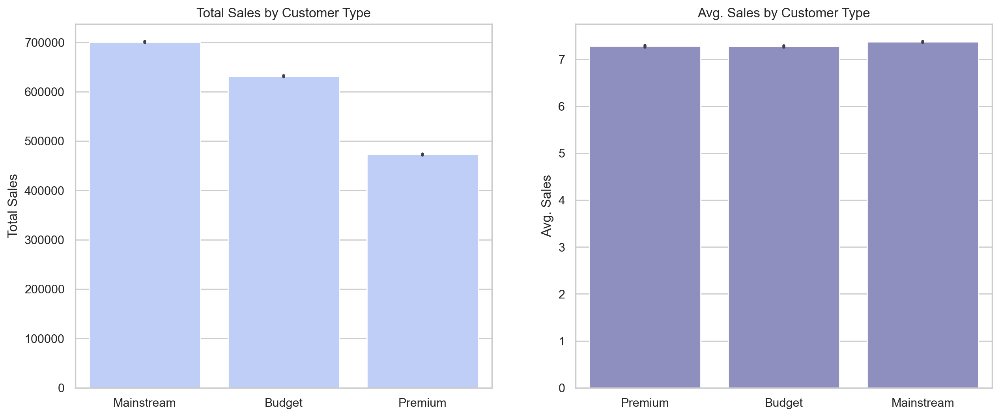

In [46]:
# Sales by premium customer
fig, ax = plt.subplots(1, 2, figsize=(15, 6), dpi=200)
#Sum total sales
order_premium = QVI_data.groupby('PREMIUM_CUSTOMER')['TOT_SALES'].sum().sort_values(ascending=False).index
sns.barplot(data=QVI_data, x='PREMIUM_CUSTOMER', y='TOT_SALES', 
            estimator=sum, order=order_premium, ax=ax[0], palette=['#b6caff'])
ax[0].set_ylabel('Total Sales')
ax[0].set_title('Total Sales by Customer Type')
ax[0].set_xlabel('')

# Average Sales per customer
sns.barplot(data=QVI_data, x='PREMIUM_CUSTOMER', y='TOT_SALES',
            estimator=np.mean, ax=ax[1], palette=[purple])
ax[1].set_ylabel('Avg. Sales')
ax[1].set_xlabel('')
ax[1].set_title('Avg. Sales by Customer Type')


For total sales, the mainstream category contributes the most. For average sales per transaction, there is not much difference in spending among the different customer categories (mainstream, budget, and premium).

### Customer Count

Customer Count by Life Stage

In [47]:
no_customers = QVI_data.groupby('LIFESTAGE')['LYLTY_CARD_NBR'].nunique().sort_values(ascending=False)

In [48]:
no_customers = pd.DataFrame(no_customers)
no_customers

,LYLTY_CARD_NBR
LIFESTAGE,
RETIREES,14555
OLDER SINGLES/COUPLES,14389
YOUNG SINGLES/COUPLES,14044
OLDER FAMILIES,9630
YOUNG FAMILIES,9036
MIDAGE SINGLES/COUPLES,7141
NEW FAMILIES,2492


In [49]:
labels = no_customers.index
labels = [textwrap.fill(label, 12) for label in labels]

([<matplotlib.axis.XTick at 0x175563290>,
 [Text(0, 0, 'RETIREES'),
  Text(1, 0, 'OLDER SINGLE\nS/COUPLES'),
  Text(2, 0, 'YOUNG SINGLE\nS/COUPLES'),
  Text(3, 0, 'OLDER\nFAMILIES'),
  Text(4, 0, 'YOUNG\nFAMILIES'),
  Text(5, 0, 'MIDAGE SINGL\nES/COUPLES'),
  Text(6, 0, 'NEW FAMILIES')])

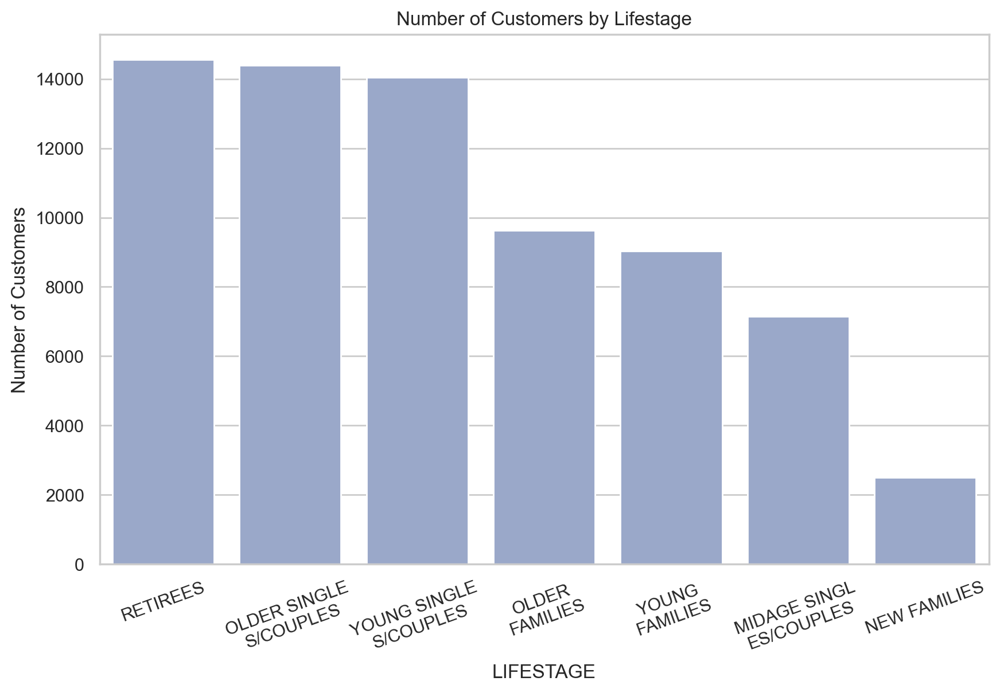

In [50]:
plt.figure(figsize=(10, 6), dpi=200)
sns.barplot(data=no_customers, x=no_customers.index, y=no_customers['LYLTY_CARD_NBR'], palette=['#92A5D1'])
plt.ylabel('Number of Customers')
plt.title('Number of Customers by Lifestage')
plt.xticks(range(len(labels)),labels,rotation = 20)

Customer Count by Customer Type

In [51]:
no_customers_type = pd.DataFrame(QVI_data.groupby('PREMIUM_CUSTOMER')['LYLTY_CARD_NBR'].nunique().sort_values(ascending=False))

In [52]:
no_customers_type

,LYLTY_CARD_NBR
PREMIUM_CUSTOMER,
Mainstream,28734
Budget,24006
Premium,18547


Text(0.5, 0, '')

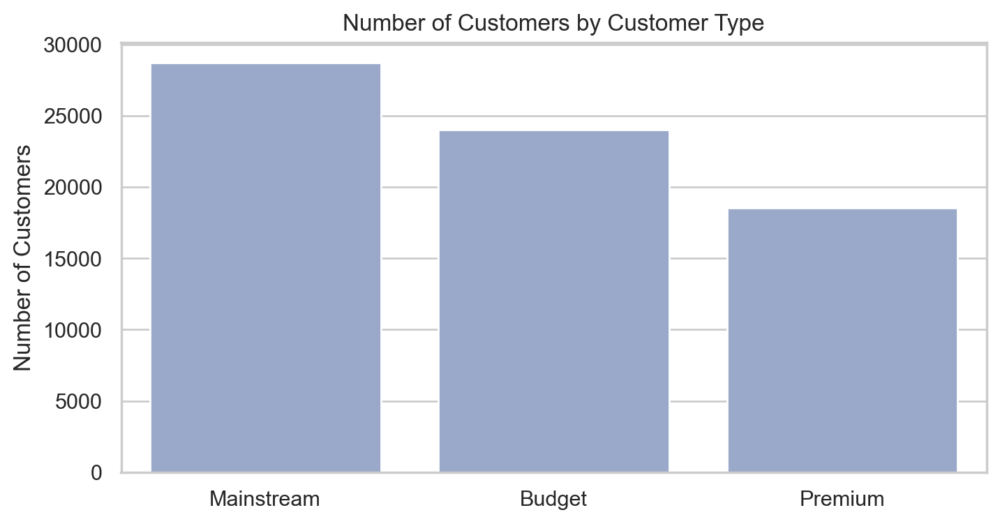

In [53]:
plt.figure(figsize=(8, 4), dpi=200)
sns.barplot(data=no_customers_type, x=no_customers_type.index, y=no_customers_type['LYLTY_CARD_NBR'], palette=['#92A5D1'])
plt.ylabel('Number of Customers')
plt.title('Number of Customers by Customer Type')
plt.xlabel('')

In [54]:
import plotly.express as px
px_qualitative_color = px.colors.qualitative.Set3

In [55]:
fig = px.pie(no_customers_type, values='LYLTY_CARD_NBR', 
             names=no_customers_type.index, title='Number of Customers by Customer Type',
             color_discrete_sequence=px_qualitative_color,
             )
fig.show()

### Average Purchase Quantity

In [56]:
from scipy.stats import ttest_ind

In [57]:
mean_quantity_Lifestage = pd.DataFrame(
    QVI_data.groupby('LIFESTAGE')['PROD_QTY'].mean().sort_values(ascending=False)
    )
labels = mean_quantity_Lifestage.index
labels = [textwrap.fill(label, 11) for label in labels]
mean_quantity_Lifestage

,PROD_QTY
LIFESTAGE,
OLDER FAMILIES,1.946410
YOUNG FAMILIES,1.940460
OLDER SINGLES/COUPLES,1.913354
MIDAGE SINGLES/COUPLES,1.901701
RETIREES,1.892593
NEW FAMILIES,1.857781
YOUNG SINGLES/COUPLES,1.834025


In [58]:
mean_quantity_Customertype = pd.DataFrame(
    QVI_data.groupby('PREMIUM_CUSTOMER')['PROD_QTY'].mean().sort_values(ascending=False)
    )
mean_quantity_Customertype

,PROD_QTY
PREMIUM_CUSTOMER,
Budget,1.910675
Premium,1.907215
Mainstream,1.902086


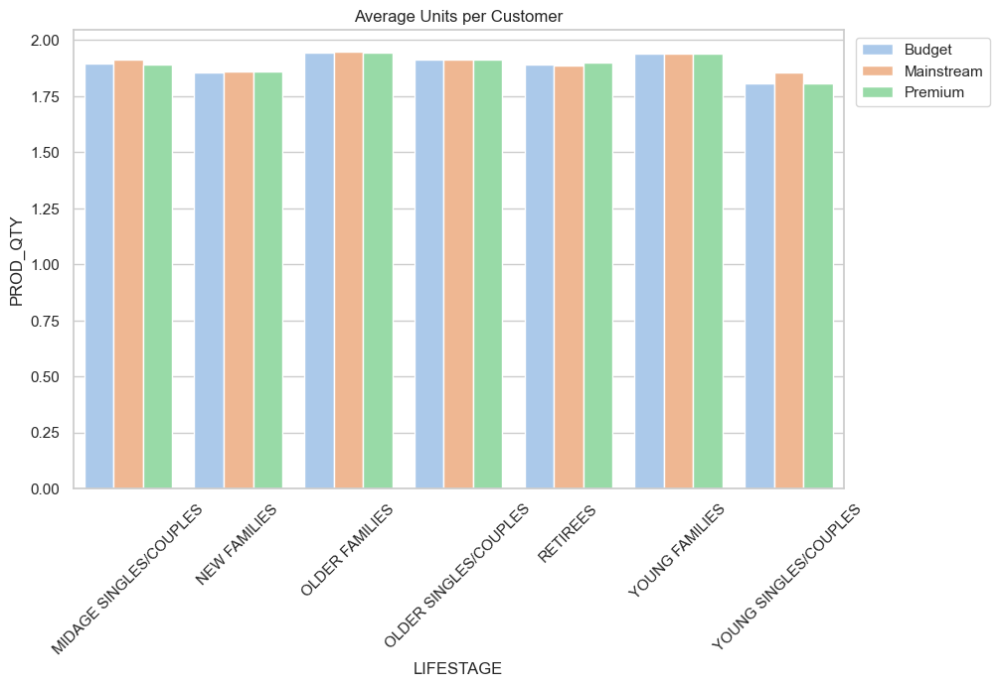

In [59]:
# Average units per transaction
avg_units = QVI_data.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])['PROD_QTY'].mean().reset_index()

# Plot average units per customer
plt.figure(figsize=(10, 6))
sns.barplot(data=avg_units, x='LIFESTAGE', y='PROD_QTY', hue='PREMIUM_CUSTOMER')
plt.xticks(rotation=45)
plt.title('Average Units per Customer')
plt.legend(loc = 'upper right', bbox_to_anchor=(1.2, 1))

Older families and young families in general buy more chips per transaction.

### Price Analysis

T-Test Analysis of **Unit Price** Preferences Between **Life Stage**

In [60]:
average_price_life = QVI_data.groupby(['LIFESTAGE'])['Unit_Price'].mean().sort_values(ascending=False)
average_price_life = pd.DataFrame(average_price_life)
average_price_life

,Unit_Price
LIFESTAGE,
NEW FAMILIES,3.906726
YOUNG SINGLES/COUPLES,3.893653
RETIREES,3.889036
MIDAGE SINGLES/COUPLES,3.871211
OLDER SINGLES/COUPLES,3.863061
YOUNG FAMILIES,3.750432
OLDER FAMILIES,3.736389


New Family, Yong Singles/Couples and Retirees are willing to pay for higher unit-price for chips. And it is related to there preference for bigger package size (bigger package's price is higher).

In [61]:
group1 = QVI_data[QVI_data['LIFESTAGE'] == 'NEW FAMILIES']['Unit_Price']
group2 = QVI_data[QVI_data['LIFESTAGE'] == 'OLDER FAMILIES']['Unit_Price']
t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

print("\nT-Test Results:")
print(f"T-Statistic: {t_stat:.3f}")
print(f"P-Value: {p_value}")



T-Test Results:
T-Statistic: 12.094
P-Value: 2.1135393871230242e-33


(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'YOUNG SINGLES/COUPLES'),
  Text(1, 0, 'MIDAGE SINGLES/COUPLES'),
  Text(2, 0, 'NEW FAMILIES'),
  Text(3, 0, 'OLDER FAMILIES'),
  Text(4, 0, 'OLDER SINGLES/COUPLES'),
  Text(5, 0, 'RETIREES'),
  Text(6, 0, 'YOUNG FAMILIES')])

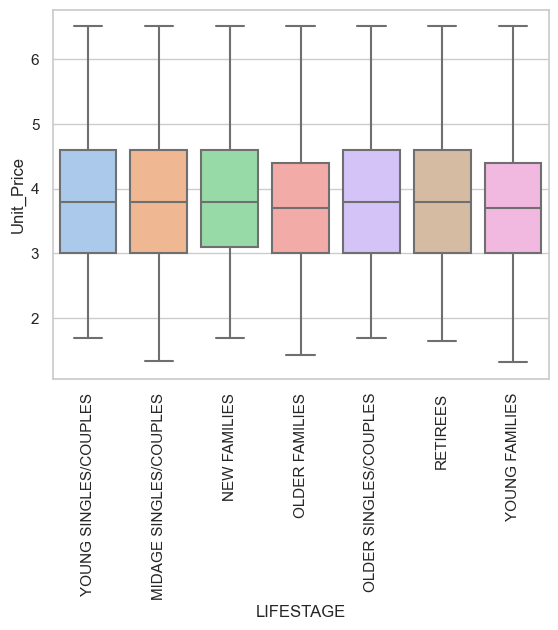

In [62]:
sns.boxplot(data=QVI_data, x='LIFESTAGE', y='Unit_Price', palette='pastel')
plt.xticks(rotation=90)

In [63]:
groups = QVI_data['LIFESTAGE'].unique()
pairs = [(g1, g2) for i, g1 in enumerate(groups) for g2 in groups[i+1:]]

results = []
for g1, g2 in pairs:
    group1 = QVI_data[QVI_data['LIFESTAGE'] == g1]['Unit_Price']
    group2 = QVI_data[QVI_data['LIFESTAGE'] == g2]['Unit_Price']
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False) 
    results.append({'Group1': g1, 'Group2': g2, 'T-Statistic': t_stat, 'P-Value': p_value})

# Convert results to a DataFrame
results_QVI_data = pd.DataFrame(results)
results_QVI_data['Significance'] = results_QVI_data['P-Value'] < 0.05
results_QVI_data

,Group1,Group2,T-Statistic,P-Value,Significance
0,YOUNG SINGLES/COUPLES,MIDAGE SINGLES/COUPLES,2.476347,1.327671e-02,True
1,YOUNG SINGLES/COUPLES,NEW FAMILIES,-0.912931,3.613027e-01,False
2,YOUNG SINGLES/COUPLES,OLDER FAMILIES,20.328276,1.285463e-91,True
3,YOUNG SINGLES/COUPLES,OLDER SINGLES/COUPLES,4.096419,4.200417e-05,True
4,YOUNG SINGLES/COUPLES,RETIREES,0.608441,5.428967e-01,False
5,YOUNG SINGLES/COUPLES,YOUNG FAMILIES,18.064774,8.708382e-73,True
6,MIDAGE SINGLES/COUPLES,NEW FAMILIES,-2.390889,1.682518e-02,True
7,MIDAGE SINGLES/COUPLES,OLDER FAMILIES,15.522708,3.292939e-54,True
8,MIDAGE SINGLES/COUPLES,OLDER SINGLES/COUPLES,0.964826,3.346370e-01,False
9,MIDAGE SINGLES/COUPLES,RETIREES,-2.083993,3.716623e-02,True


T-Test Analysis of **Package Size** Preferences Between **Life Stage**

In [64]:
average_size_life = pd.DataFrame(
    QVI_data.groupby(['LIFESTAGE'])['Package_Size_g'].mean().sort_values(ascending=False)
)
average_size_life

,Package_Size_g
LIFESTAGE,
YOUNG SINGLES/COUPLES,176.343166
MIDAGE SINGLES/COUPLES,176.075776
RETIREES,175.880102
OLDER SINGLES/COUPLES,175.534385
OLDER FAMILIES,175.202312
NEW FAMILIES,175.166538
YOUNG FAMILIES,174.875438


In [65]:
# t-test for package size
groups = QVI_data['LIFESTAGE'].unique()
pairs = [(g1, g2) for i, g1 in enumerate(groups) for g2 in groups[i+1:]]

results = []
for g1, g2 in pairs:
    group1 = QVI_data[QVI_data['LIFESTAGE'] == g1]['Package_Size_g']
    group2 = QVI_data[QVI_data['LIFESTAGE'] == g2]['Package_Size_g']
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False) 
    results.append({'Group1': g1, 'Group2': g2, 'T-Statistic': t_stat, 'P-Value': p_value})

# Convert results to a DataFrame
results_QVI_data = pd.DataFrame(results)
results_QVI_data['Significance'] = results_QVI_data['P-Value'] < 0.05
results_QVI_data.sort_values(by='P-Value')

,Group1,Group2,T-Statistic,P-Value,Significance
5,YOUNG SINGLES/COUPLES,YOUNG FAMILIES,3.350228,0.000808,True
2,YOUNG SINGLES/COUPLES,OLDER FAMILIES,2.664394,0.007714,True
20,RETIREES,YOUNG FAMILIES,2.503246,0.012308,True
10,MIDAGE SINGLES/COUPLES,YOUNG FAMILIES,2.462818,0.013789,True
3,YOUNG SINGLES/COUPLES,OLDER SINGLES/COUPLES,1.909704,0.056175,False
7,MIDAGE SINGLES/COUPLES,OLDER FAMILIES,1.825447,0.067940,False
16,OLDER FAMILIES,RETIREES,-1.735698,0.082621,False
19,OLDER SINGLES/COUPLES,YOUNG FAMILIES,1.682417,0.092491,False
1,YOUNG SINGLES/COUPLES,NEW FAMILIES,1.446001,0.148211,False
8,MIDAGE SINGLES/COUPLES,OLDER SINGLES/COUPLES,1.141416,0.253703,False


T-Test Analysis of **Unit Price** Preferences Between **Customer Groups**

In [66]:
average_price_type = QVI_data.groupby(['PREMIUM_CUSTOMER'])['Unit_Price'].mean().sort_values(ascending=False)
average_price_type = pd.DataFrame(average_price_type)
average_price_type

,Unit_Price
PREMIUM_CUSTOMER,
Mainstream,3.873657
Premium,3.813059
Budget,3.801726


In [67]:
groups = QVI_data['PREMIUM_CUSTOMER'].unique()
pairs = [(g1,g2) for i, g1 in enumerate(groups) for g2 in groups[i+1:]]

results_type = []
for g1, g2 in pairs:
    group1 = QVI_data[QVI_data['PREMIUM_CUSTOMER'] == g1]['Unit_Price']
    group2 = QVI_data[QVI_data['PREMIUM_CUSTOMER'] == g2]['Unit_Price']
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False)
    results_type.append({'Group1': g1, 'Group2': g2, 'T-Statistic': t_stat, 'P-Value': p_value})
results_type = pd.DataFrame(results_type)
results_type['Significance'] = results_type['P-Value'] < 0.05   
results_type

,Group1,Group2,T-Statistic,P-Value,Significance
0,Premium,Budget,2.012844,4.413290e-02,True
1,Premium,Mainstream,-11.057236,2.078836e-28,True
2,Budget,Mainstream,-14.241289,5.380220e-46,True


In [68]:
px.box(x='PREMIUM_CUSTOMER', y='Unit_Price', data_frame=QVI_data, color='PREMIUM_CUSTOMER', title='Unit Price by Customer Type')

In [69]:
QVI_data.groupby(['PREMIUM_CUSTOMER']).describe()['Unit_Price']

,count,mean,std,min,25%,50%,75%,max
PREMIUM_CUSTOMER,,,,,,,,
Budget,86762.0,3.801726,1.085845,1.32,3.0,3.8,4.4,6.5
Mainstream,95043.0,3.873657,1.064461,1.35,3.0,3.8,4.6,6.5
Premium,64935.0,3.813059,1.084502,1.35,3.0,3.8,4.6,6.5


Mainstream customer are willing to pay higher unit_price for chips.

T-Test Analysis of **Package Size** Preferences Between **Customer Groups**

In [70]:
# t-test for package size and customer type
groups = QVI_data['PREMIUM_CUSTOMER'].unique()
pairs = [(g1,g2) for i, g1 in enumerate(groups) for g2 in groups[i+1:]]

results_type_size = []
for g1, g2 in pairs:
    group1 = QVI_data[QVI_data['PREMIUM_CUSTOMER'] == g1]['Package_Size_g']
    group2 = QVI_data[QVI_data['PREMIUM_CUSTOMER'] == g2]['Package_Size_g']
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False)
    results_type_size.append({'Group1': g1, 'Group2': g2, 'T-Statistic': t_stat, 'P-Value': p_value})
results_type_size = pd.DataFrame(results_type_size)
results_type_size['Significance'] = results_type_size['P-Value'] < 0.05   
results_type_size

,Group1,Group2,T-Statistic,P-Value,Significance
0,Premium,Budget,0.190580,0.848855,False
1,Premium,Mainstream,-1.993608,0.046197,True
2,Budget,Mainstream,-2.375760,0.017514,True


In [71]:
average_pack_type = QVI_data.groupby(['PREMIUM_CUSTOMER'])['Package_Size_g'].mean().sort_values(ascending=False)
average_pack_type = pd.DataFrame(average_pack_type)
average_pack_type

,Package_Size_g
PREMIUM_CUSTOMER,
Mainstream,175.975895
Premium,175.371079
Budget,175.312694


In [72]:
plt.figure(figsize=(10, 6), dpi=200)
px.box(data_frame=QVI_data, x='PREMIUM_CUSTOMER', 
       y='Package_Size_g', 
       color='PREMIUM_CUSTOMER',
       title='Package Size by Customer Type',
)

<Figure size 2000x1200 with 0 Axes>

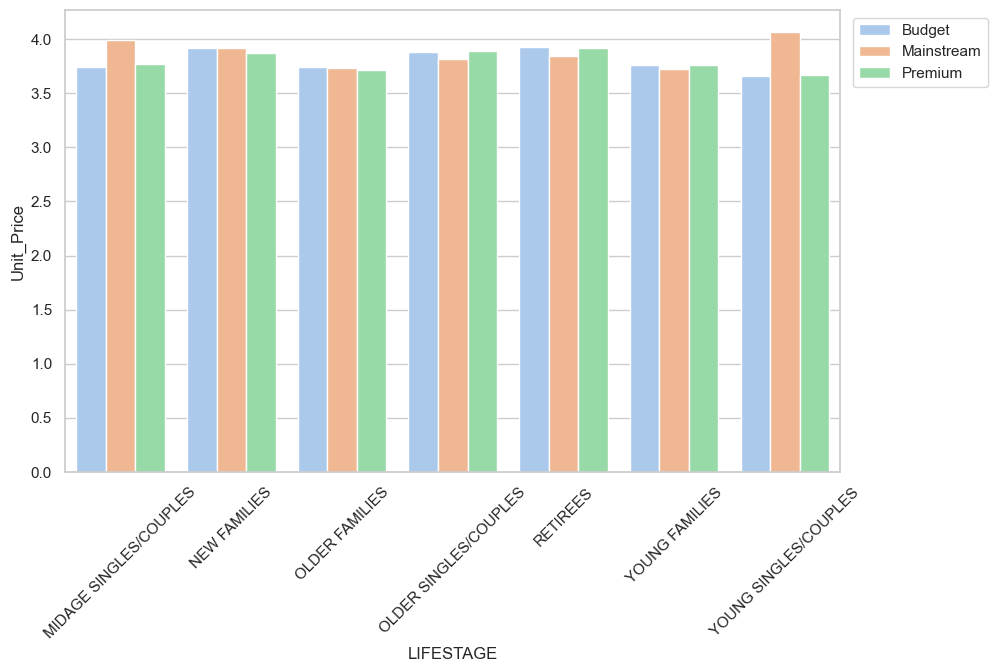

In [90]:
avg_price = QVI_data.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])['Unit_Price'].mean().reset_index()
plt.figure(figsize=(10, 6))
sns.barplot(data=avg_price, x='LIFESTAGE', y='Unit_Price', hue='PREMIUM_CUSTOMER')
plt.xticks(rotation=45)

plt.legend(loc = 'upper right', bbox_to_anchor=(1.2, 1))

Mainstream - 'Midage' and 'Young' Singles and Couples" are more willing to pay a higher price per packet of chips compared to their Budget and Premium counterparts. This may be because Premium shoppers are more likely to purchase healthier snacks, and when they do buy chips, it is primarily for entertainment purposes rather than personal consumption. This is further supported by the fact that there are fewer "Premium' - Mid-age and Young Singles and Couples buying chips compared to their Mainstream counterparts.